<a href="https://colab.research.google.com/github/naemililia/masterthesis/blob/main/evaluate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Test & evaluate the model

what the original authors did:
- mean intersection over union for the water class on
  - bolivia test set
  - 'normal' test set
- ommission and commission error for the water class
- show some samples of images and predictions

what some other papers did to evaluate semantic segmentation:
- relative improvement over starting from random initialization averaged across all the datasets (Caron, location-aware self supervised transformers for semantic segmentation)
- OA (overall accuracy?) (semantic segmentation of remote sensing images with self supervised semantic aware inpainting)


what I want to do:
- the image of the training process that is printed out anyway
- the mean intersection over union
- some example images
- intersection over union per class (we only have one i guess)
- compare to baseline results
- overall accuracy
- omission and commission if i can

In [ ]:
!pip install rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 16.9 MB/s eta 0:00:00


In [ ]:
!pip install segmentation-models-pytorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 13.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_6

In [ ]:
import rasterio
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import os
import csv
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from matplotlib import pyplot as plt
import segmentation_models_pytorch as smp
import torchvision.models as models
import torch.nn as nn
import torchvision.transforms.functional as F
from torchvision.transforms.functional import to_pil_image
from matplotlib.colors import ListedColormap
from tqdm import tqdm_notebook as tqdm
import json

In [ ]:
# connect drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Load the finetuned model

Here i will first create a shell of the same architecture as the finetuned model. For pretext pretrained models, this will be a UNet with 2 classes at the end. For contrastive learning pretrained models, it will also be a unet with 2 classes at the end

In [ ]:
net = smp.Unet(encoder_name="resnet18", encoder_weights=None, in_channels = 2, classes= 2)

In [ ]:
def convertBNtoGN(module, num_groups=16):
  """
  this was included from senfloods creators.
  possible explanation:
    GroupNorm was introduced as an alternative to BatchNorm, especially beneficial for cases where the batch size is small (in our case: 16).
    GroupNorm divides the channels into groups and computes the mean and standard deviation within these groups for normalization.
  """
  if isinstance(module, torch.nn.modules.batchnorm.BatchNorm2d):
    return nn.GroupNorm(num_groups, module.num_features,
                        eps=module.eps, affine=module.affine)
    if module.affine:
        mod.weight.data = module.weight.data.clone().detach()
        mod.bias.data = module.bias.data.clone().detach()

  for name, child in module.named_children():
      module.add_module(name, convertBNtoGN(child, num_groups=num_groups))

  return module

In [ ]:
# all the pretext pretrained ones were transfrmed to GN, for CL both was tried out

net = convertBNtoGN(net)

In [ ]:
# this is to retrieve

TYPE_TO_EVALUATE = 'finetune' # 'baseline_senfloods', 'pretext', 'finetune'
saved_model_name = 'finetune_LC_CL_256_39_withBN_with_all_data_30_0.5599036812782288.cp'


model_save_path = '/content/drive/MyDrive/Uni/TUB/Semester/5 - Masterarbeit/models/' + TYPE_TO_EVALUATE +'/'
checkpoints = os.listdir(model_save_path)
state_dict = torch.load(model_save_path + saved_model_name)

In [ ]:
net.load_state_dict(state_dict)

<All keys matched successfully>

## Load test data

In [ ]:
# load their train test split of hand labeled

#!gsutil cp gs://sen1floods11/v1.1/splits/flood_handlabeled/flood_train_data.csv .
!gsutil cp gs://sen1floods11/v1.1/splits/flood_handlabeled/flood_test_data.csv .
#!gsutil cp gs://sen1floods11/v1.1/splits/flood_handlabeled/flood_valid_data.csv .
!gsutil cp gs://sen1floods11/v1.1/splits/flood_handlabeled/flood_bolivia_data.csv .

Copying gs://sen1floods11/v1.1/splits/flood_handlabeled/flood_test_data.csv...
/ [1 files][  4.7 KiB/  4.7 KiB]                                                
Operation completed over 1 objects/4.7 KiB.                                      
Copying gs://sen1floods11/v1.1/splits/flood_handlabeled/flood_bolivia_data.csv...
/ [1 files][  834.0 B/  834.0 B]                                                
Operation completed over 1 objects/834.0 B.                                      


In [ ]:
# load their hand labeled data

!sudo mkdir files
!sudo mkdir files/S1
!sudo mkdir files/Labels

!gsutil -m rsync -r gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand files/S1
!gsutil -m rsync -r gs://sen1floods11/v1.1/data/flood_events/HandLabeled/LabelHand files/Labels


both the source and destination. Your crcmod installation isn't using the
module's C extension, so checksumming will run very slowly. If this is your
first rsync since updating gsutil, this rsync can take significantly longer than
usual. For help installing the extension, please see "gsutil help crcmod".

Building synchronization state...
Starting synchronization...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_233925_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_103757_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_314919_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_23014_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_129334_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_195474_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/

In [ ]:
def getArrFlood(fname):
  return rasterio.open(fname).read()

def download_flood_water_data_from_list(l):
  i = 0
  tot_nan = 0
  tot_good = 0
  flood_data = []
  for (im_fname, mask_fname) in l:
    if not os.path.exists(os.path.join("files/", im_fname)):
      continue
    arr_x = np.nan_to_num(getArrFlood(os.path.join("files/", im_fname)))
    arr_y = getArrFlood(os.path.join("files/", mask_fname))
    arr_y[arr_y == -1] = 255

    arr_x = np.clip(arr_x, -50, 1)
    arr_x = (arr_x + 50) / 51

    if i % 100 == 0:
      print(im_fname, mask_fname)
    i += 1
    flood_data.append((arr_x,arr_y))

  return flood_data

def load_flood_test_data(input_root, label_root):
  fname = "flood_test_data.csv"
  testing_files = []
  with open(fname) as f:
    for line in csv.reader(f):
      testing_files.append(tuple((input_root+line[0], label_root+line[1])))

  return download_flood_water_data_from_list(testing_files)

def load_flood_bolivia_data(input_root, label_root):
  fname = "flood_bolivia_data.csv"
  testing_files = []
  with open(fname) as f:
    for line in csv.reader(f):
      testing_files.append(tuple((input_root+line[0], label_root+line[1])))

  return download_flood_water_data_from_list(testing_files)

In [ ]:
class InMemoryDataset(torch.utils.data.Dataset):

  def __init__(self, data_list, preprocess_func):
    self.data_list = data_list
    self.preprocess_func = preprocess_func

  def __getitem__(self, i):
    return self.preprocess_func(self.data_list[i])

  def __len__(self):
    return len(self.data_list)

def processTestIm(data):
  (x,y) = data
  im,label = x.copy(), y.copy()
  norm = transforms.Normalize([0.6851, 0.5235], [0.0820, 0.1102])

  # convert to PIL for easier transforms
  im_c1 = Image.fromarray(im[0]).resize((512,512))
  im_c2 = Image.fromarray(im[1]).resize((512,512))
  label = Image.fromarray(label.squeeze()).resize((512,512))

  im_c1s = [F.crop(im_c1, 0, 0, 256, 256), F.crop(im_c1, 0, 256, 256, 256),
            F.crop(im_c1, 256, 0, 256, 256), F.crop(im_c1, 256, 256, 256, 256)]
  im_c2s = [F.crop(im_c2, 0, 0, 256, 256), F.crop(im_c2, 0, 256, 256, 256),
            F.crop(im_c2, 256, 0, 256, 256), F.crop(im_c2, 256, 256, 256, 256)]
  labels = [F.crop(label, 0, 0, 256, 256), F.crop(label, 0, 256, 256, 256),
            F.crop(label, 256, 0, 256, 256), F.crop(label, 256, 256, 256, 256)]

  ims = [torch.stack((transforms.ToTensor()(x).squeeze(),
                    transforms.ToTensor()(y).squeeze()))
                    for (x,y) in zip(im_c1s, im_c2s)]

  ims = [norm(im) for im in ims]
  ims = torch.stack(ims)

  labels = [(transforms.ToTensor()(label).squeeze()) for label in labels]
  labels = torch.stack(labels)

  if torch.sum(labels.gt(.003) * labels.lt(.004)):
    labels *= 255
  labels = labels.round()

  return ims, labels

In [ ]:
test_data = load_flood_test_data('S1/', 'Labels/')
test_dataset = InMemoryDataset(test_data, processTestIm)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=4, shuffle=False, sampler=None,
                  batch_sampler=None, num_workers=0, collate_fn=lambda x: (torch.cat([a[0] for a in x], 0), torch.cat([a[1] for a in x], 0)),
                  pin_memory=True, drop_last=False, timeout=0,
                  worker_init_fn=None)
test_iter = iter(test_loader)

S1/Ghana_313799_S1Hand.tif Labels/Ghana_313799_LabelHand.tif


In [ ]:
89 / 4 # --> i will only visualize one image per batch

22.25

In [ ]:
bolivia_data = load_flood_bolivia_data('S1/', 'Labels/')
bolivia_dataset = InMemoryDataset(bolivia_data, processTestIm)
bolivia_loader = torch.utils.data.DataLoader(bolivia_dataset, batch_size=1, shuffle=False, sampler=None,
                  batch_sampler=None, num_workers=0, collate_fn=lambda x: (torch.cat([a[0] for a in x], 0), torch.cat([a[1] for a in x], 0)),
                  pin_memory=True, drop_last=False, timeout=0,
                  worker_init_fn=None)
bolivia_iter = iter(bolivia_loader)

S1/Bolivia_103757_S1Hand.tif Labels/Bolivia_103757_LabelHand.tif


## Evaluate

In [ ]:
# metrics to calculate here:

def computeIOU(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()

  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  intersection = torch.sum(output * target)
  union = torch.sum(target) + torch.sum(output) - intersection
  iou = (intersection + .0000001) / (union + .0000001)

  if iou != iou:
    print("failed, replacing with 0")
    iou = torch.tensor(0).float()

  return iou

def computeAccuracy(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()

  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  correct = torch.sum(output.eq(target))

  return correct.float() / len(target)

def truePositives(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()
  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  correct = torch.sum(output * target)

  return correct

def trueNegatives(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()
  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  output = (output == 0)
  target = (target == 0)
  correct = torch.sum(output * target)

  return correct

def falsePositives(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()
  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  output = (output == 1)
  target = (target == 0)
  correct = torch.sum(output * target)

  return correct

def falseNegatives(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()
  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  output = (output == 0)
  target = (target == 1)
  correct = torch.sum(output * target)

  return correct

In [ ]:
colors = plt.cm.viridis(np.linspace(0, 1, 81))  # Using 'viridis' for demonstration
cmap_sar = ListedColormap(colors)

In [ ]:
def visualize_segmentation_example(net, test_data_loader):
    net.eval()  # Ensure the model is in evaluation mode.
    net.cuda()  # Ensure the model operates on the GPU.

    with torch.no_grad():  # Disable gradient computation for efficiency.
        # Iterating over the test dataset to get a single batch.
        for images, labels in tqdm(test_data_loader):
            images, labels = images.cuda(), labels.cuda()

            # Obtain the model's predictions.
            outputs = net(images)
            # Assuming the outputs are raw logits, apply softmax to obtain probabilities.
            probs = torch.softmax(outputs, dim=1)
            # Convert probabilities to predicted class labels.
            predicted_masks = torch.argmax(probs, dim=1)

            # Move the tensors to the CPU for visualization.
            images, labels, predicted_masks = images.cpu(), labels.cpu(), predicted_masks.cpu()

            # Convert the first image and masks to PIL images for easy visualization.
            original_image = to_pil_image(images[0])
            true_mask = to_pil_image(labels[0].unsqueeze(0).float())  # Adding channel dimension for compatibility.
            predicted_mask = to_pil_image(predicted_masks[0].unsqueeze(0).byte())
            print(predicted_mask.size)

            # Visualization
            fig, ax = plt.subplots(1, 3, figsize=(20, 10))
            ax[0].imshow(original_image)
            ax[0].set_title('Original Image')
            ax[0].axis('off')

            ax[1].imshow(true_mask, )
            ax[1].set_title('True Mask')
            ax[1].axis('off')

            ax[2].imshow(predicted_mask, )
            ax[2].set_title('Predicted Mask')
            ax[2].axis('off')

            plt.show()

            # Break after the first batch to only visualize one example.
            break

# Assuming net and test_data_loader are already defined and initialized.
#visualize_segmentation_example(net, test_loader)

In [ ]:
def visualize_segmentation_example_within_loop(images, labels, fig_save_path, i, bolivia_used):
  images, labels = images.cuda(), labels.cuda()

  # Obtain the model's predictions.
  outputs = net(images)
  # Assuming the outputs are raw logits, apply softmax to obtain probabilities.
  probs = torch.softmax(outputs, dim=1)
  # Convert probabilities to predicted class labels.
  predicted_masks = torch.argmax(probs, dim=1)

  # Move the tensors to the CPU for visualization.
  images, labels, predicted_masks = images.cpu(), labels.cpu(), predicted_masks.cpu()

  # Convert the first image and masks to PIL images for easy visualization.
  original_image = to_pil_image(images[0])
  true_mask = to_pil_image(labels[0].unsqueeze(0).float())  # Adding channel dimension for compatibility.
  predicted_mask = to_pil_image(predicted_masks[0].unsqueeze(0).byte())
  print(predicted_mask.size)

  # Visualization
  fig, ax = plt.subplots(1, 3, figsize=(20, 10))
  ax[0].imshow(images[0][0], cmap=cmap_sar, vmin=-4, vmax=4)
  ax[0].set_title('Original Image Band 1')
  ax[0].axis('off')

  ax[1].imshow(true_mask)
  ax[1].set_title('True Mask')
  ax[1].axis('off')

  ax[2].imshow(predicted_mask)
  ax[2].set_title('Predicted Mask')
  ax[2].axis('off')

  fig.savefig(os.path.join(fig_save_path, f"{i}_{bolivia_used}_combined_figure.png"))

  plt.show()

  plt.close(fig)


In [ ]:
RUNNAME = 'reevaluate_LC_CL_BN' + saved_model_name
fig_save_path = '/content/drive/MyDrive/Uni/TUB/Semester/5 - Masterarbeit/models/evaluate/finetuned_cl_lc_BN/reevaluate/' # NEEDS TO BE ADAPTED ALWAYS

In [ ]:
def test_loop(test_data_loader, net, bolivia_used, fig_save_path):
  net = net.eval()
  net = net.cuda()
  count = 0
  iou = 0
  loss = 0
  accuracy = 0
  tp = 0
  fp = 0
  tn = 0
  fn = 0
  i = 0
  with torch.no_grad():
      for (images, labels) in tqdm(test_data_loader):
          print(i)
          net = net.cuda()
          outputs = net(images.cuda())
          valid_iou = computeIOU(outputs, labels.cuda())
          iou += valid_iou
          accuracy += computeAccuracy(outputs, labels.cuda())
          tp +=  truePositives(outputs, labels.cuda())
          fp +=  falsePositives(outputs, labels.cuda())
          tn +=  trueNegatives(outputs, labels.cuda())
          fn +=  falseNegatives(outputs, labels.cuda())
          count += 1
          visualize_segmentation_example_within_loop(images, labels, fig_save_path, i, bolivia_used)
          i +=1

  iou = iou / count
  print("Test Mean IOU:", iou)
  print("Total IOU:", (tp.float() / (fn + fp + tp)))
  print("OMISSON:", fn.float() / (fn + tp))
  print("COMMISSON:", fp.float() / (tn + fp))
  print("Test Accuracy:", accuracy / count)

  with open(f'{fig_save_path}_{RUNNAME}_evaluation_{bolivia_used}.json', 'w') as f:
    json.dump({'mean iou': iou.item(),
               'count': count,
               'accuracy (has to be divided by count)': accuracy.item(),
               'tp': tp.item(),
               'fp': fp.item(),
               'tn': tn.item(),
               'fn': fn.item()}, f)

<ipython-input-20-8b2be6927028>:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for (images, labels) in tqdm(test_data_loader):


  0%|          | 0/23 [00:00<?, ?it/s]

0
(256, 256)


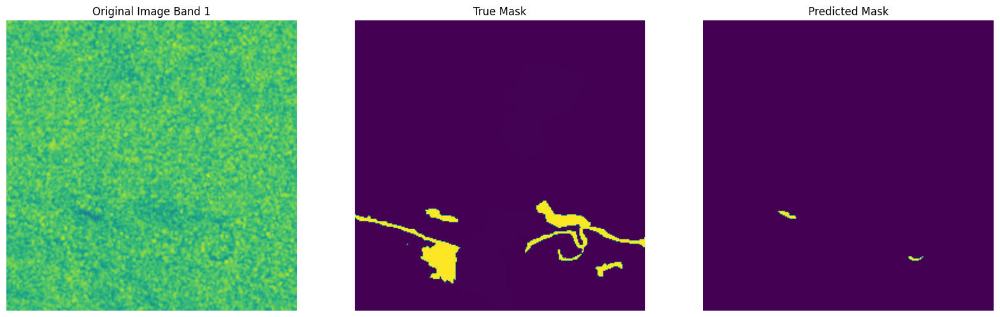

1
(256, 256)


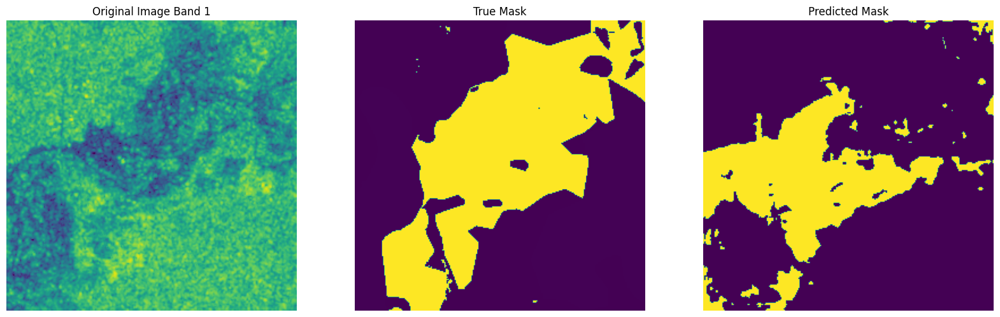

2
(256, 256)


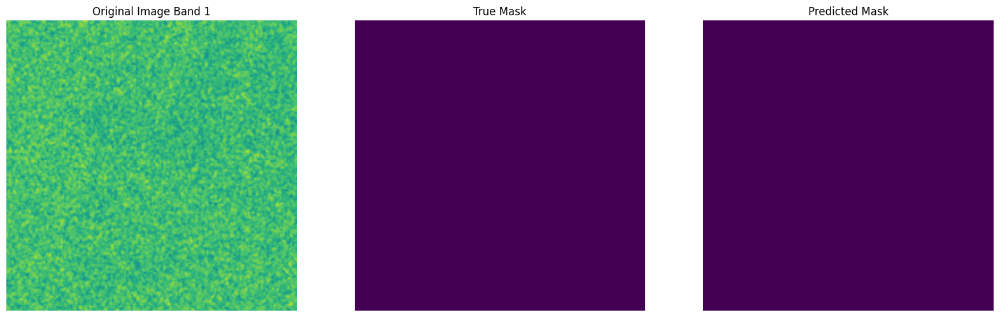

3
(256, 256)


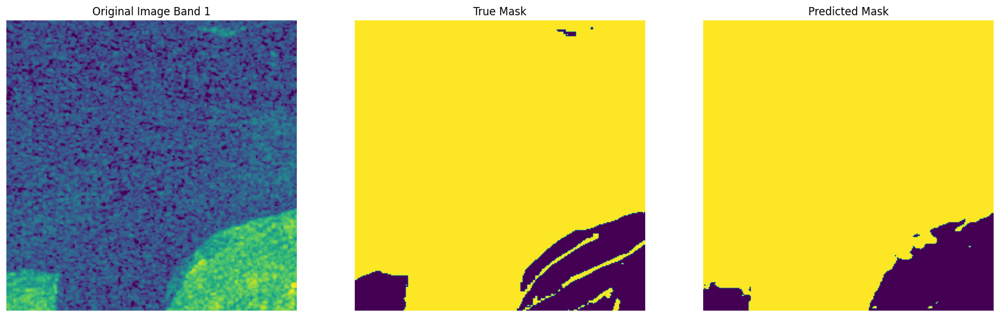

4
(256, 256)


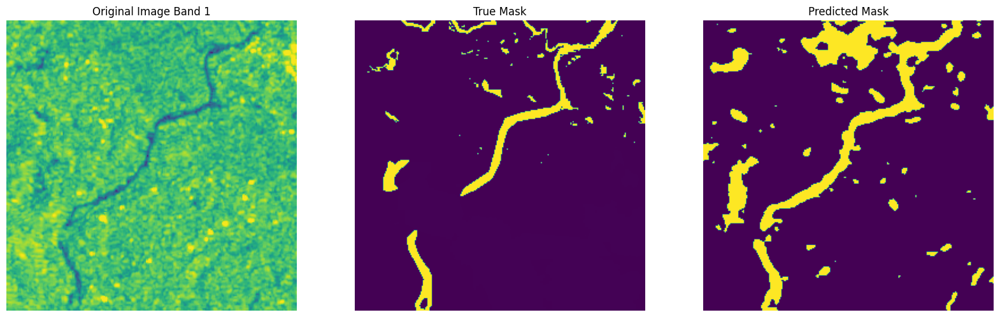

5
(256, 256)


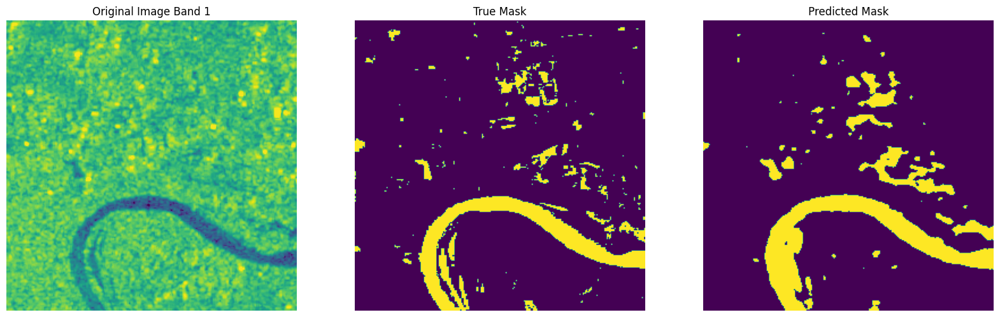

6
(256, 256)


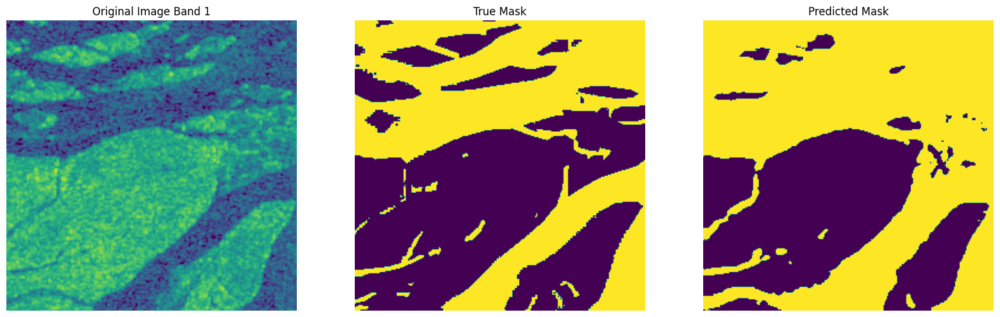

7
(256, 256)


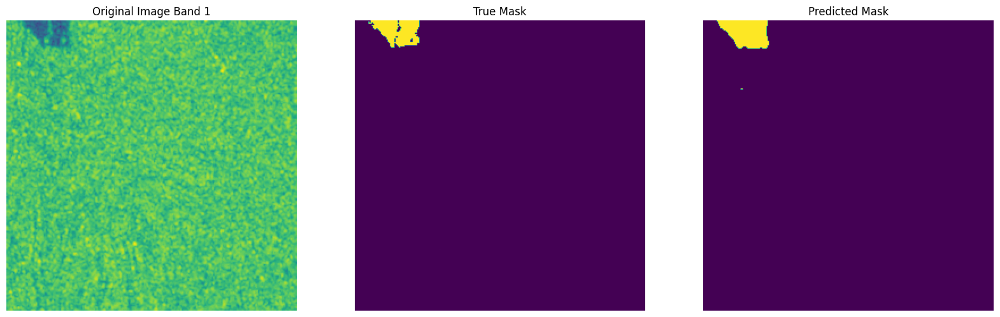

8
(256, 256)


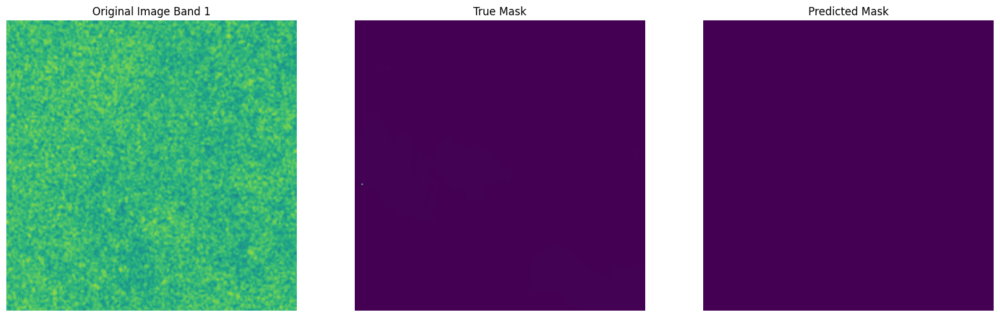

9
(256, 256)


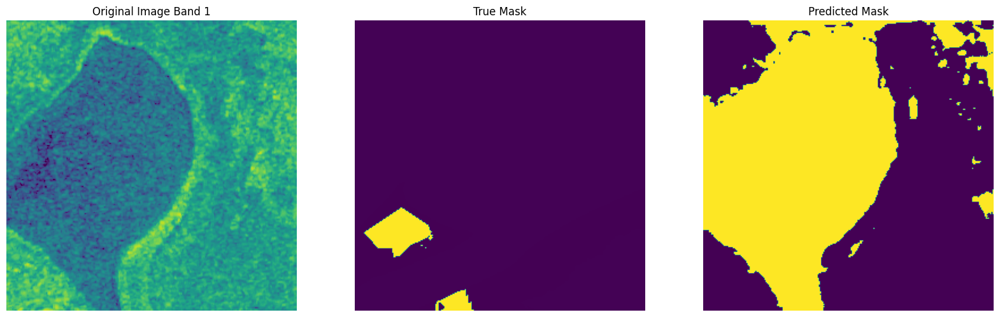

10
(256, 256)


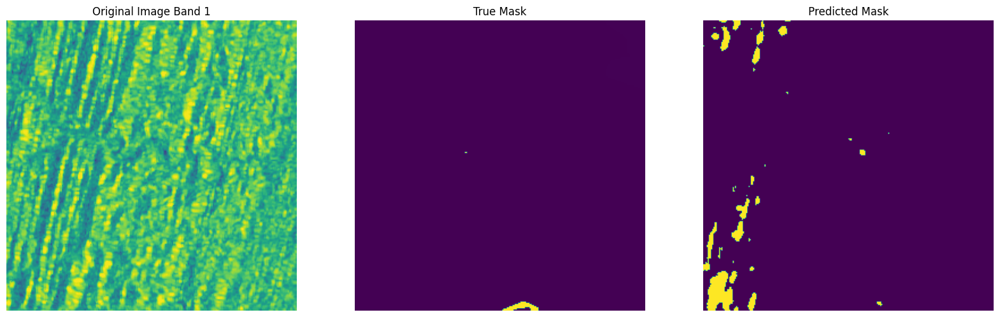

11
(256, 256)


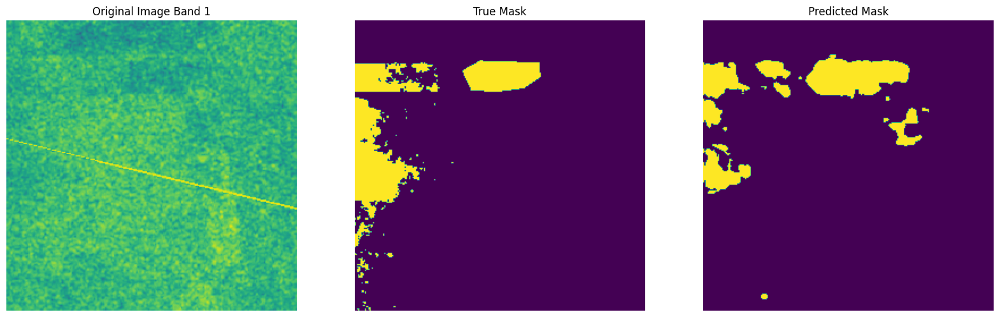

12
(256, 256)


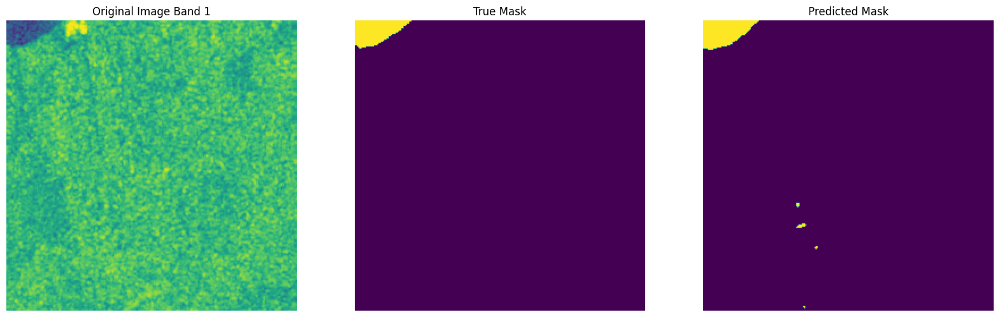

13
(256, 256)


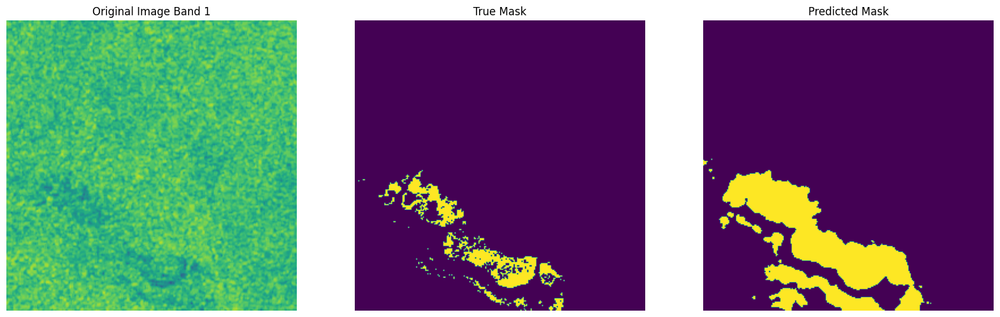

14
(256, 256)


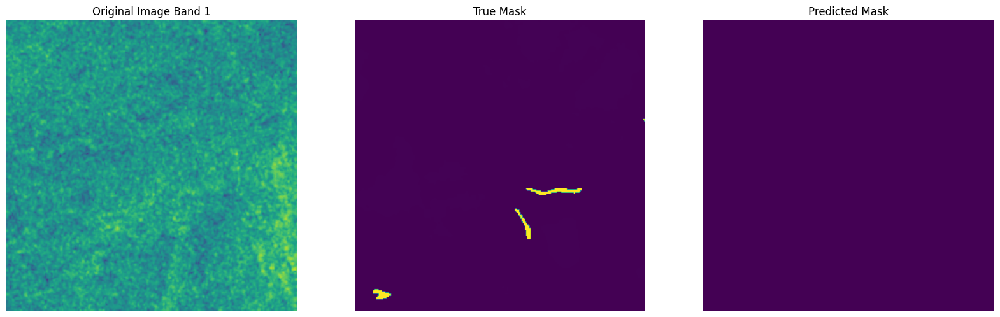

15
(256, 256)


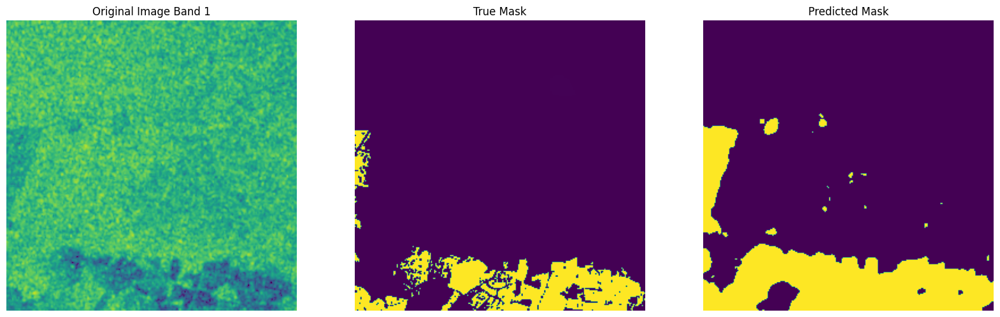

16
(256, 256)


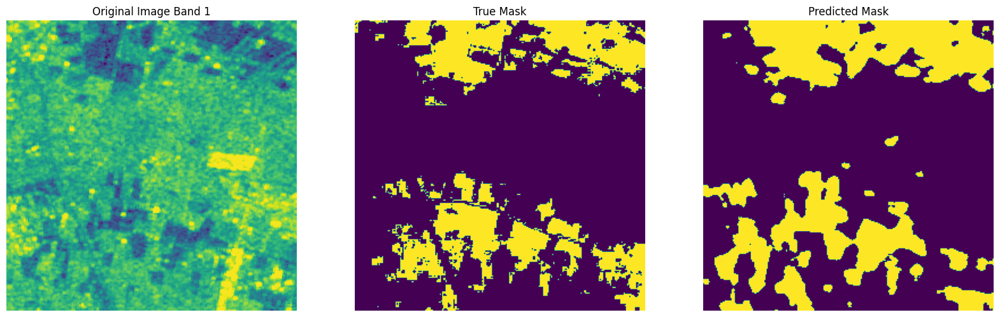

17
(256, 256)


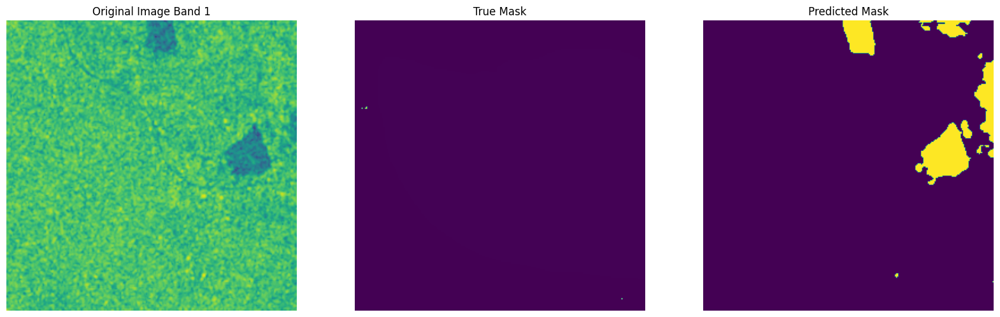

18
(256, 256)


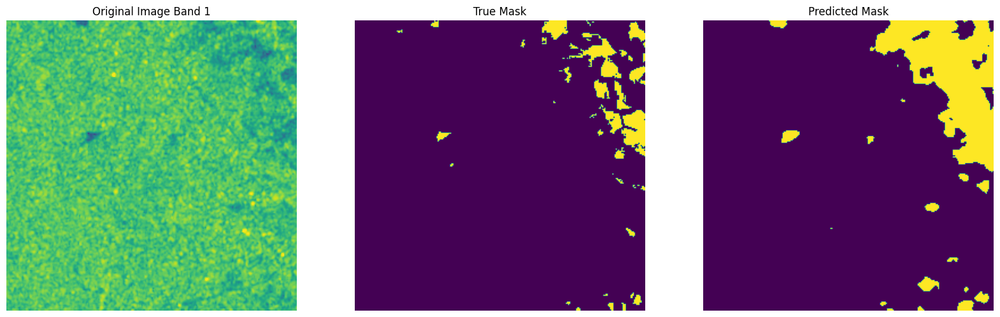

19
(256, 256)


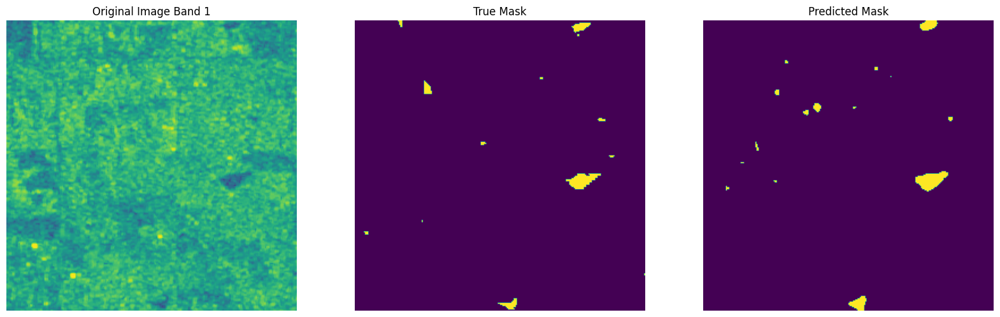

20
(256, 256)


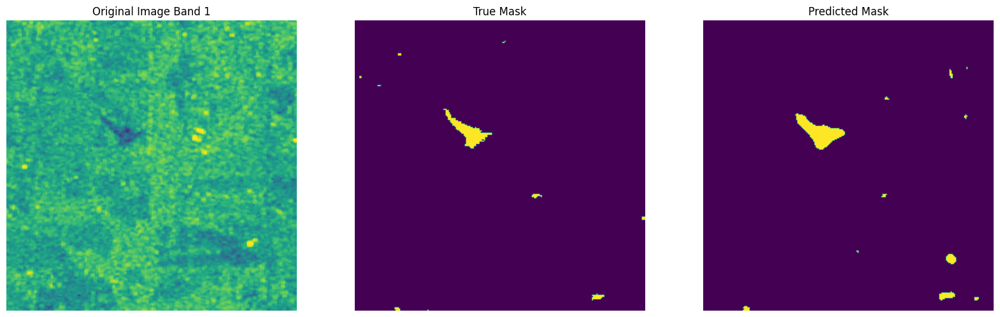

21
(256, 256)


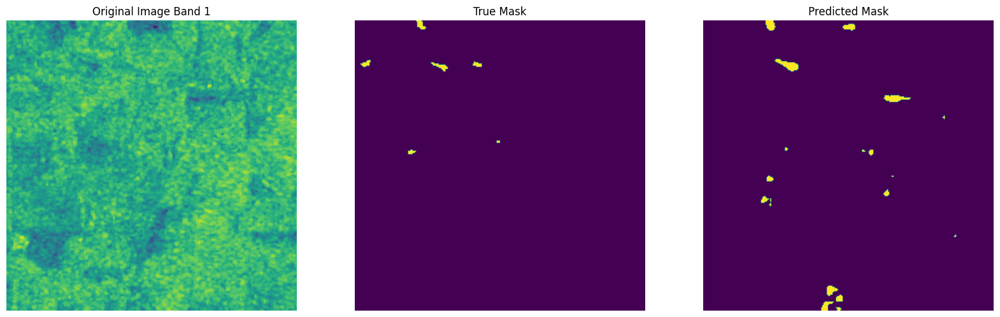

22
(256, 256)


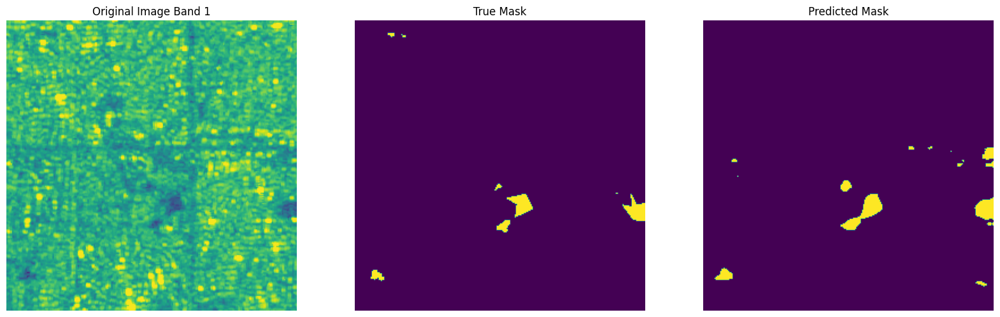

Test Mean IOU: tensor(0.5238, device='cuda:0')
Total IOU: tensor(0.6105, device='cuda:0')
OMISSON: tensor(0.1419, device='cuda:0')
COMMISSON: tensor(0.0580, device='cuda:0')
Test Accuracy: tensor(0.9317, device='cuda:0')


In [ ]:
test_loop(test_loader, net, 'test', fig_save_path) # 'test' / 'bolivia'

<ipython-input-20-8b2be6927028>:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for (images, labels) in tqdm(test_data_loader):


  0%|          | 0/15 [00:00<?, ?it/s]

0
(256, 256)


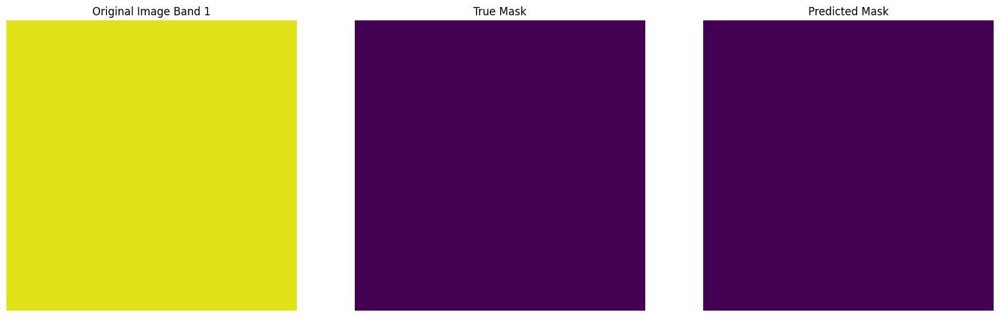

1
(256, 256)


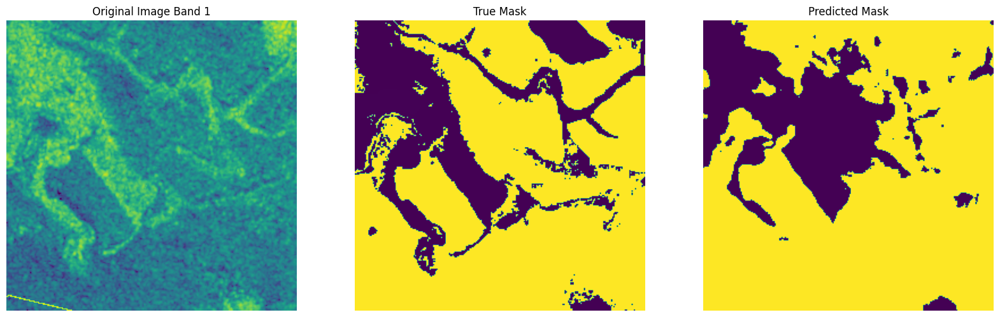

2
(256, 256)


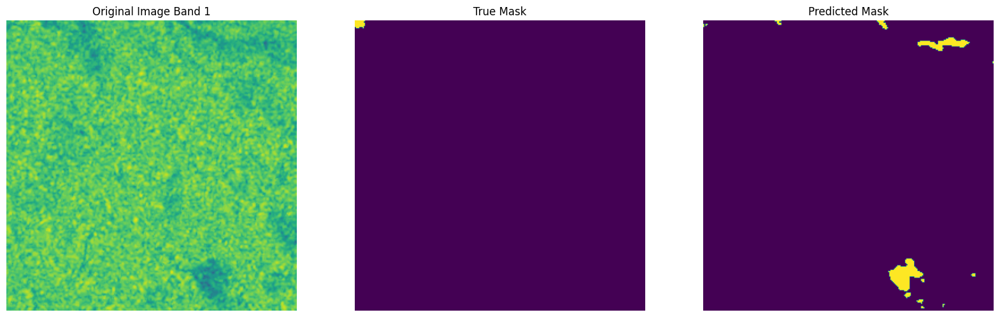

3
(256, 256)


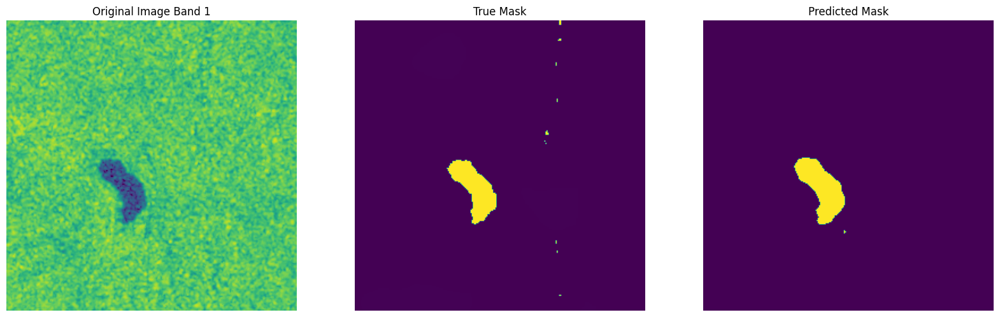

4
(256, 256)


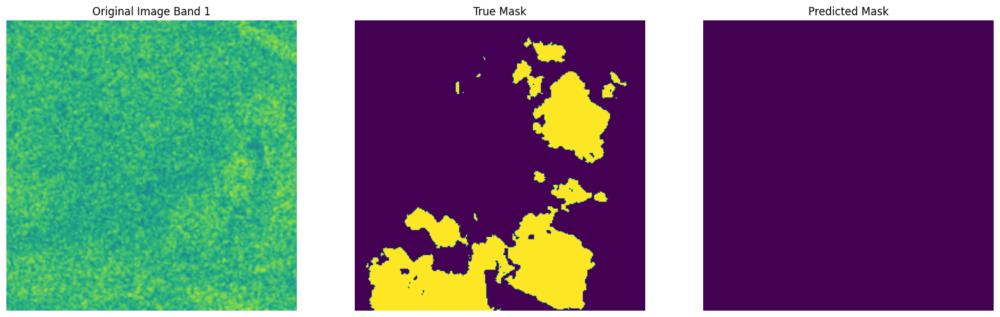

5
(256, 256)


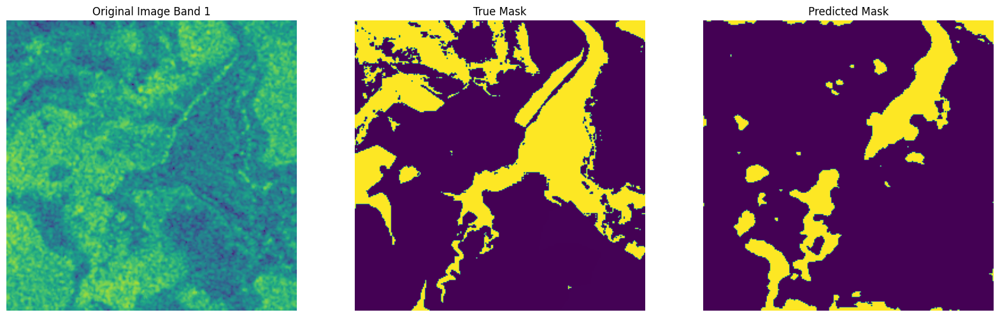

6
(256, 256)


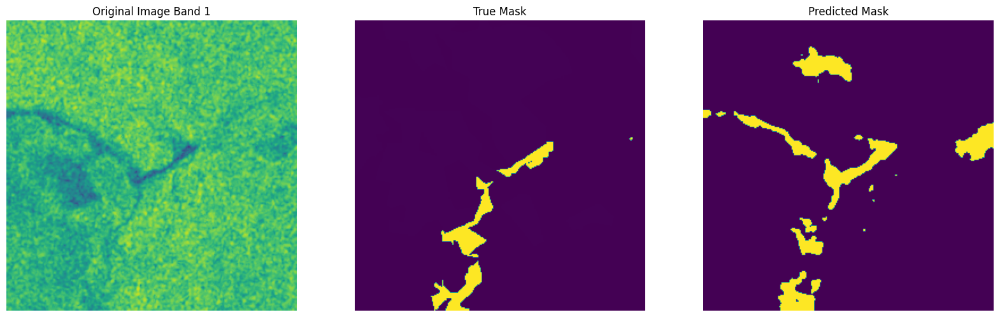

7
(256, 256)


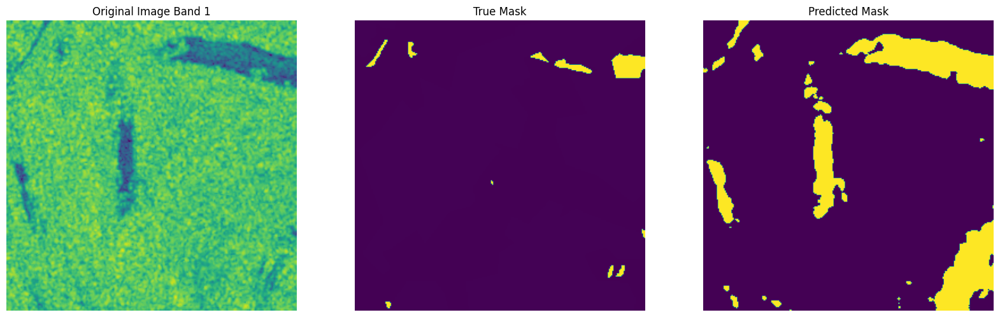

8
(256, 256)


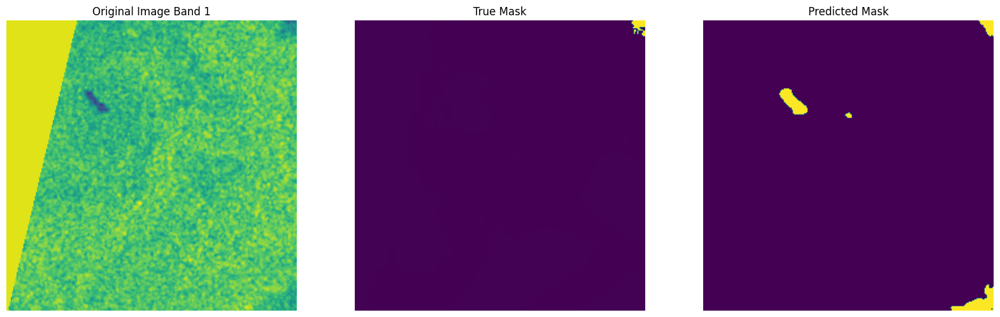

9
(256, 256)


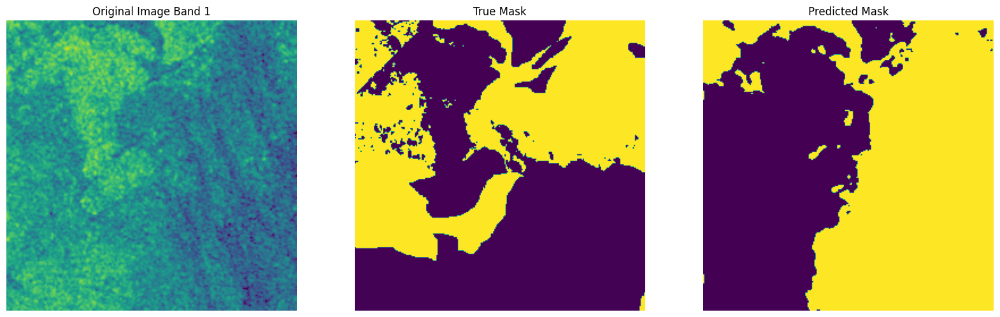

10
(256, 256)


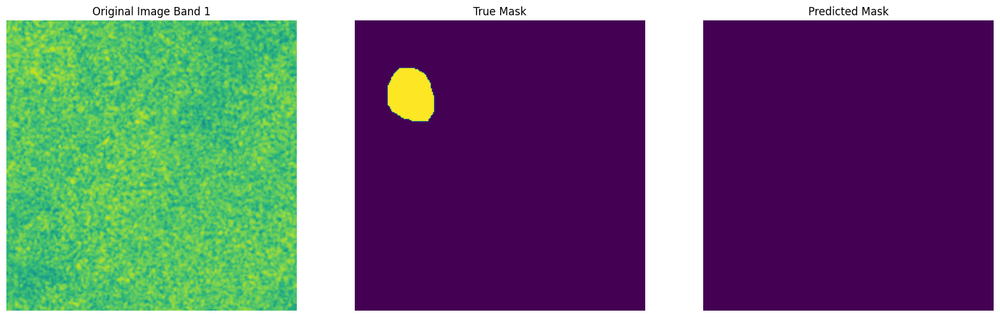

11
(256, 256)


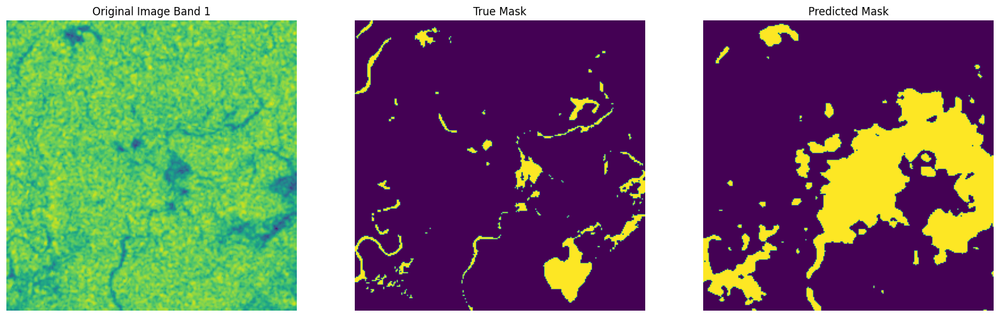

12
(256, 256)


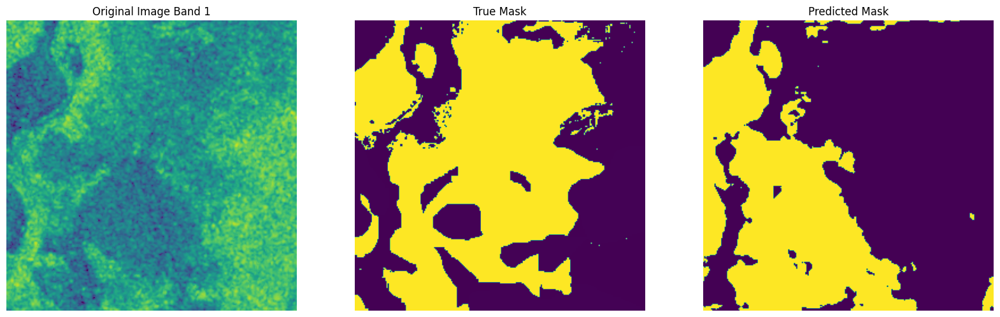

13
(256, 256)


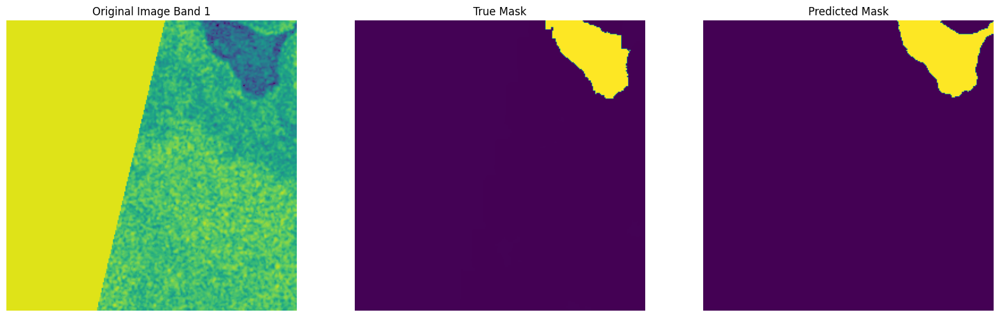

14
(256, 256)


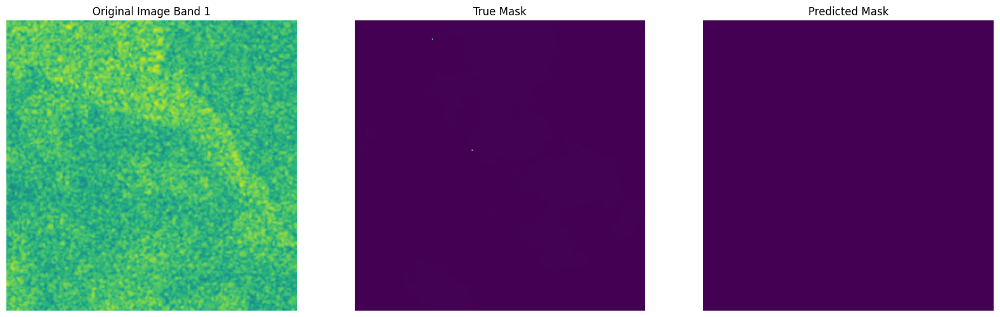

Test Mean IOU: tensor(0.3984, device='cuda:0')
Total IOU: tensor(0.5765, device='cuda:0')
OMISSON: tensor(0.2521, device='cuda:0')
COMMISSON: tensor(0.0560, device='cuda:0')
Test Accuracy: tensor(0.9077, device='cuda:0')


In [ ]:
test_loop(bolivia_loader, net, 'bolivia', fig_save_path) # 'test' / 'bolivia'